In [1]:
import csv
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import copy
import re
# 库
# -*- coding: utf-8 -*-

In [2]:
sum = 0
teamLocationW = {}
def workGame(l):#统计主客场胜局数，败局数
	position = l['MATCHUP'].find('-')
	team = l['MATCHUP'][position+1:position+5]
	L = l['LOCATION']
	W = l['W']
	global teamLocationW
	if team not in teamLocationW:
		teamLocationW[team] = {"H":{"W":0,"L":0},"A":{"W":0,"L":0}}
	teamLocationW[team][L][W]+=1
	if L=='H':
		global sum
		sum += l['FINAL_MARGIN']
def work_subtask1(table):
    table.apply(workGame,axis=1)
    print("主场平均得分 - 客场平均得分 = " ,sum / table.shape[0])#计算主客场平均得分差
    df = pd.DataFrame({"球队":[t for t in teamLocationW],
    "主场胜率":[teamLocationW[t]['H']['W']/(teamLocationW[t]['H']['W']+teamLocationW[t]['H']['L']) for t in teamLocationW],
    "客场胜率":[teamLocationW[t]['A']['W']/(teamLocationW[t]['A']['W']+teamLocationW[t]['A']['L']) for t in teamLocationW],
    "主客场胜率差":[teamLocationW[t]['H']['W']/(teamLocationW[t]['H']['W']+teamLocationW[t]['H']['L'])-teamLocationW[t]['A']['W']/(teamLocationW[t]['A']['W']+teamLocationW[t]['A']['L']) for t in teamLocationW]},
    columns = ['球队',"主场胜率","客场胜率","主客场胜率差"]
    )#主客胜率表格
    display(df)#输出


In [3]:
def work_subtask2(table):
	c=0
	x,y,tm,cy,tc = [],[],[],[],[]
	tmp1,tmp2 = [],[]
	for t in table.values:
		x.append(t[11])#投篮距离
		y.append(t[16])#防守距离
		tm.append(t[8])#进攻时间
		if t[10]>0:
			tmp1.append(t[11])
			if t[10]<2.0 and t[9]==0:
				tmp2.append(t[11])
		cy.append(t[9])#运球数
		if t[10]>0:
			tc.append(t[10])#运球时间
	
	from pylab import mpl
	mpl.rcParams['font.sans-serif'] = ['SimHei']
	#------------------------------------------------分割线------------------------------------------------
	plt.xlabel(u'投篮距离')
	plt.ylabel(u'防守距离')
	plt.title(u'投篮距离及防守距离分布')
	plt.plot(x,y,'.y')
	plt.show()

	plt.title(u'投篮距离及防守距离分布图')
	plt.ylabel(u'投篮次数')
	plt.hist(x,bins=100,facecolor="blue", edgecolor="black", label = '投篮距离' , alpha=0.9)
	plt.hist(y,bins=100,facecolor="red", edgecolor="black", label = '防守距离' , alpha=0.6)
	plt.legend()
	plt.show()

	#------------------------------------------------分割线------------------------------------------------
	plt.title(u'投篮时间分布图')#图标头
	plt.xlabel(u'进攻时间')#横坐标标签
	plt.ylabel(u'投篮次数')#纵坐标标签
	plt.hist(tm,bins=40,facecolor='green',edgecolor='black',label='进攻时间' ,alpha = 1)#绘制柱状图
	plt.text(22,4300,"绝大多数为二次进攻",color='red',fontsize=8,horizontalalignment="right")#写入文本
	plt.arrow(22,4400,1.7,220,length_includes_head=True, width=0.01,shape='full')#绘制箭头
	plt.legend()#图例
	plt.show()#显示输出
	#------------------------------------------------分割线------------------------------------------------
	plt.title(u'投篮前运球次数')
	plt.xlabel(u'运球次数')
	plt.ylabel(u'投篮次数')
	plt.hist(cy,bins=32,facecolor='green',edgecolor='black',label='运球次数',alpha = 1)
	plt.legend()
	plt.show()

	plt.title(u'投篮前控球时间')
	plt.xlabel(u'控球时间')
	plt.ylabel(u'投篮次数')
	plt.hist(tc,bins=80,facecolor='green',edgecolor='black',label='运球时间',alpha = 1)
	plt.legend()
	plt.show()
	tmp = [len(list(filter(lambda x:x>=i and x<i+1,tmp2)))/len(list(filter(lambda x:x>=i and x<i+1,tmp1)))for i in range(0,30)]
	
	plt.title(u'接球就投与距离关系')
	plt.xlabel(u'篮筐距离')
	plt.ylabel(u'投篮次数')
	plt.plot(tmp,color='green')
	plt.show()

In [4]:
player = {}
def work_subtask3(table):
	for t in table.values:
		name = t[19]
		dist = t[11]
		result = t[13]
		score = t[18]
		# print(name,dist,result,score)
		if name not in player:
			player[name] = {"made":[],"missed":[],'score':0}
		player[name][result].append(dist)
		player[name]['score'] += score #计算总分
	sort_player = []
	for p in player:
		sort_player.append({**{"name":p},**player[p]}) #将字典中元素放入列表中
	sort_player = sorted(sort_player,key = lambda x:x["score"],reverse=True) #排序
	for i in range(0,3):#前三名绘图
		plt.title(sort_player[i]['name'])
		plt.xlabel(u'投篮距离')
		plt.ylabel(u'次数')
		plt.hist(sort_player[i]['made'],bins=100,facecolor="blue", edgecolor="black", label = 'made' , alpha=1.0)
		plt.hist(sort_player[i]['missed'],bins=100,facecolor="red", edgecolor="black", label = 'missed' ,alpha=0.5)
		plt.legend()
		plt.show()

In [5]:
shot_table = pd.read_csv('./shot_logs.csv')#读入表格
# print(shot_table)
game_table = pd.DataFrame({"GAME_ID":shot_table["GAME_ID"],"MATCHUP":shot_table["MATCHUP"],"LOCATION":shot_table["LOCATION"],"W":shot_table["W"],"FINAL_MARGIN":shot_table["FINAL_MARGIN"]})#从shot_table中取部分列制作新的表格
game_table.drop_duplicates(subset=['GAME_ID','MATCHUP'],inplace=True)#去重
game_table.sort_values('GAME_ID',inplace=True)#按GAME_ID排序
game_table.set_index('GAME_ID',inplace=True)#将id设为GAME_ID

In [6]:
def changeTime(t):#将时间转化为分钟
	m,s = t.split(':')
	return int(m)*60+int(s)
from math import log
def calcShannonEnt(data):#计算熵
	numdata = len(data)
	labelCount = {'made' : 0,'missed' : 0}
	for d in data:
		labelCount[d['result']] +=1
	ShannonEnt = 0.0
	for label in labelCount:
		prob = (labelCount[label]+1) / (numdata+1)
		ShannonEnt -= prob * log(prob,2)
	return ShannonEnt
def calcShannonEnt2(missed,made):#根据数据中missed和made计算熵
	numdata = missed+made
	ShannonEnt = 0.0
	probmissed = (missed + 1) / (numdata + 1)
	probmade = (missed + 1) / (numdata + 1)
	ShannonEnt -= probmissed * log(probmissed,2)
	ShannonEnt -= probmade * log(probmade,2)
	return ShannonEnt
def splitData(data,feature,value,LorR = 'L'):#将数据按某一个特征的某一个值分为左右两个数据，LorR判断是左边数据或右边数据
	returnData = []
	if LorR == 'L':
		for d in data:
			if d[feature] < value:
				returnData.append(d)
	else:
		for d in data:
			if d[feature] >= value:
				returnData.append(d)
	return returnData

def chooseBestFeature(data,label):#选择最优的特征
	baseEntropy = calcShannonEnt(data)#计算原始熵值
	bestgain = 0.0
	bestFeature = -1
	bestPartValue = None
	for i in label:#枚举特征
		featureList = [l[i] for l in data] #取出data中对应的特征值
		uniquefeatureList = set(featureList)
		nowEntropy = 23333
		nowPartValue = None #初值
		sortuniquefeatureList = list(uniquefeatureList)
		sortuniquefeatureList.sort() #将特征值排序去重
		# print(len(sortuniquefeatureList))
		#下述代码为计算最优分割值以及对应熵，具体实现为从小到大枚举分割点，分割点的移动会影响左右两侧数据常数个数据点，以“L”，“R”开头变量记录左右数据信息并在移动分割点后维护出新的信息。
		E = []
		data.sort(key = lambda x:x[i])
		Lcount,Rcount = 0,len(data)
		Lmissed,Lmade = 0,0
		Rmissed,Rmade = [l['result'] for l in data].count('missed'),[l['result'] for l in data].count('made')
		# print(Lmissed,Lmade,Rmissed,Rmade)
		now = 0
		for j in range(len(sortuniquefeatureList)-1):
			PartValue = (sortuniquefeatureList[j-1]+sortuniquefeatureList[j])/2.
			while data[now][i]<PartValue:
				if data[now]['result']=='missed':
					Lmissed += 1
					Rmissed -= 1
				else:
					Lmade += 1
					Rmade -= 1
				now += 1
				Lcount += 1
				Rcount -= 1
			# dataL = splitData(data,i,PartValue,'L')
			# dataR = splitData(data,i,PartValue,'R')
			
			probL = Lcount / len(data)
			probR = Rcount / len(data)
			Entropy = probL * calcShannonEnt2(Lmissed,Lmade) + probR * calcShannonEnt2(Rmissed,Rmade)#此处为新的熵值
			E.append(Entropy)
			if Entropy<nowEntropy:
				nowEntropy = Entropy
				nowPartValue = PartValue
		gain = baseEntropy - nowEntropy#计算gain
		if gain > bestgain:
			bestgain = gain
			bestFeature = i
			bestPartValue = nowPartValue
	return bestFeature,bestPartValue

def majorityCnt(resultList):
	#根据数据中出现最多的结果作为该节点的返回值（减枝时使用）
	missedCount = resultList.count('missed')
	madeCount = resultList.count('made')
	if missedCount > madeCount:
		return 'missed'
	else:
		return 'made'

def CreateTree(data,label,deep):#建决策树
	resultList = [l['result'] for l in data]
	if resultList.count(resultList[0]) == len(resultList):#所有结果相同
		return resultList[0]
	if deep>20:#深度过深
		return majorityCnt(resultList)
	bestFeature,bestPartValue = chooseBestFeature(data,label)#最优分割特征及对应分割值
	if bestFeature == -1:
		return majorityCnt(resultList)
	bestFeatLabel = bestFeature + '<' + str(bestPartValue)
	Tree = {bestFeatLabel:{'TRUE':None,'FALSE':None}}
	Tree[bestFeatLabel]['TRUE'] = CreateTree(splitData(data,bestFeature,bestPartValue,'L'),label,deep+1)#左子树
	Tree[bestFeatLabel]['FALSE'] = CreateTree(splitData(data,bestFeature,bestPartValue,'R'),label,deep+1)#右子树
	return Tree

In [7]:
f classify(Tree,test):#根据决策树判断
	answer = None
	rot = list(Tree.keys())[0]
	label= str(rot)[:str(rot).find('<')]#特征
	PartValue = float(str(rot)[str(rot).find('<')+1:])#分割值
	if test[label] < PartValue:#左
		if type(Tree[rot]['TRUE']).__name__ == 'dict':
			answer = classify(Tree[rot]['TRUE'],test)
		else:
			answer = Tree[rot]['TRUE']
	else:#右
		if type(Tree[rot]['FALSE']).__name__ == 'dict':
			answer = classify(Tree[rot]['FALSE'],test)
		else:
			answer = Tree[rot]['FALSE']
	return answer

def testing(Tree,test,label):#计算用决策树的正确率
	c = 0
	if len(test) == 0:
		return 0
	for i in test:
		if classify(Tree,i)==i['result']:
			c += 1
	return c / len(test)
def testintMajor(result,test):#计算以出现次数最多的结果的正确率
	c = 0
	if len(test) == 0:
		return 1
	for i in test:
		if (i['result']==result):
			c += 1
	return c / len(test)
def postPruningTree(Tree, data ,test, label):
	#剪枝 从下向上，对于每一个节点计算决策树所得的正确率和众数结果所得的正确率
	# print(data)
	rot = list(Tree.keys())[0]
	resultList = [d['result'] for d in data]
	if '<' in rot:
		key = re.compile("(.+<)").search(rot).group()[:-1]#特征
		value = float(re.compile("(<.+)").search(rot).group()[1:])#分割值
	# labelid = label.index(key)
	if type(Tree[rot]['TRUE']).__name__ == 'dict':#左
		subData = splitData(data,key,value,'L')
		subTest = splitData(test,key,value,'L')
		Tree[rot]['TRUE'] = postPruningTree(Tree[rot]['TRUE'],subData,subTest,label)
	if type(Tree[rot]['FALSE']).__name__ == 'dict':#右
		subData = splitData(data,key,value,'R')
		subTest = splitData(test,key,value,'R')
		Tree[rot]['FALSE'] = postPruningTree(Tree[rot]['FALSE'],subData,subTest,label)
	
	# print(testing(Tree,test,label),testintMajor(majorityCnt(resultList),test))
	if testing(Tree,test,label) <= testintMajor(majorityCnt(resultList),test):#若 决策树<=众数 取众数
		return majorityCnt(resultList)
	else:
		return Tree

def DTTreeTrain(data,test):
	# print(len(data))
	label = ['shot_number','period','game_clock','shot_clock','dribbles','touch_time','shot_dist','close_def_dist','attack','defence','attackDist']
	data0 = []
	for i in range(9):
		data0.append(data[int(len(data)*i/9):int(len(data)*(i+1)/9)])#将训练数据分成九份
	Tree0 = []
	for i in range(9):#共建造9棵决策树，其中第i个为以其他8份训练数据作为训练数据，第i份数据作为剪枝的验证数据
		datatmp = []
		for j in range(9):
			if i!=j:
				datatmp += data0[j]
		Tree = CreateTree(datatmp,label,0)
		postPruningTree(Tree,datatmp,test,label)
		Tree0.append(Tree)
	c = 0
	for i in range(len(test)):
		cnt = 0
		for Tree in Tree0:
			if classify(Tree,test[i])=='missed':
				cnt += 1
		if cnt>=5 and test[i]['result']=='missed':
			c += 1
		elif cnt<5 and test[i]['result']=='made':
			c += 1
		#9棵决策树，以众数为测试答案
	print(c/len(test))#计算正确率
	# m = int(len(data) / 10 * 7)
	# Tree = CreateTree(data[:m],label,0)
	# postPruningTree(Tree,data[:m],data[m+1:],label)
	# c = 0
	# for i in range(len(test)):
	# 	# print(classify(Tree,train[i]),train[i]['result'])
	# 	if classify(Tree,test[i])==test[i]['result']:
	# 		c += 1
	# print(c/len(test))

attackR,defenceR = {},{}
Rpoint = {}
def work_subtask4(table):
	data = []
	for t in table.values:#计算每个球员的命中率及防守成功率
		attack = t[19]
		defence = t[14]
		if attack not in attackR:
			attackR[attack] = [0,0]
		if defence not in defenceR:
			defenceR[defence] = [0,0]
		if attack not in Rpoint:
			Rpoint[attack] = {'total':[],'made':[]}
		Rpoint[attack]['total'].append(t[11])
		attackR[attack][1] += 1
		defenceR[defence][1] += 1
		if t[13] == "made":
			attackR[attack][0] += 1
			Rpoint[attack]['made'].append(t[11])
		else:
			defenceR[defence][0] += 1
	for t in table.values:
		shot_number = t[5]
		period = t[6]
		game_clock = changeTime(t[7])
		shot_clock = t[8]
		if np.isnan(shot_clock):
			shot_clock = game_clock + 0.5
		dribbles = t[9]#运球数
		touch_time = t[10]
		shot_dist = t[11]
		close_def_dist = t[16]
		attack = attackR[t[19]][0]/attackR[t[19]][1]#命中率
		defence = defenceR[t[14]][0]/defenceR[t[14]][1]#防守成功率
		result = t[13]
		# attackDist = 0
		attackDist = np.sum(list(map(lambda x:x>t[11]-2 and x<t[11]+2 ,Rpoint[t[19]]['made'])))/np.sum(list(map(lambda x:x>t[11]-2 and x<t[11]+2 ,Rpoint[t[19]]['total'])))#该球员在该点附近的投球成功率
		# print(attackDist,len(Rpoint[t[19]]['total']))
		data.append({"shot_number":shot_number,'period':period,'game_clock':game_clock,'shot_clock':shot_clock,
		'dribbles':dribbles,'touch_time':touch_time,'shot_dist':shot_dist,'close_def_dist':close_def_dist,'attack':attack,'defence':defence,
		'attackDist':attackDist,
		'result':result})

	# F = [("shot_number",1,38,38),('period',1,7,7),('game_clock',0,720,720),('shot_clock',0,24,240),('dribbles',0,33,33),('touch_time',0,24,240),('shot_dist',0,50,500),('close_def_dist',0,30,300),('attack',0,1,1000),('defence',0,1,1000),('attackDist',0,1,1000)]
	# f=F[0]
	# missed = []
	# made = []
	# for d in data:
	# 	if d[f[0]]>=f[1] and d[f[0]]<=f[1]:
	# 		if d['result']=='missed':
	# 			missed.append(d[feature])
	# 		else:
	# 			made.append(d[feature])
	# print(min(missed),max(missed),min(made),max(made))
	# print(missed)
	# print(made)
	random.shuffle(data)
	m = 100000#前90%作为训练数据，后10%作为测试数据
	train_data,test_data = data[:m],data[m+1:]
	DTTreeTrain(train_data,test_data)

SyntaxError: invalid syntax (<ipython-input-7-4237df98df7f>, line 1)

In [8]:
work_subtask1(game_table)

主场平均得分 - 客场平均得分 =  1.0757743362831858


,球队,主场胜率,客场胜率,主客场胜率差
0,ORL,0.300000,0.312500,-0.012500
1,NOP,0.677419,0.400000,0.277419
2,SAS,0.750000,0.500000,0.250000
3,DAL,0.677419,0.612903,0.064516
4,HOU,0.718750,0.607143,0.111607
5,LAL,0.310345,0.225806,0.084538
6,CHA,0.466667,0.413793,0.052874
7,MIL,0.592593,0.454545,0.138047
8,PHI,0.275862,0.156250,0.119612
9,IND,0.517241,0.354839,0.162403


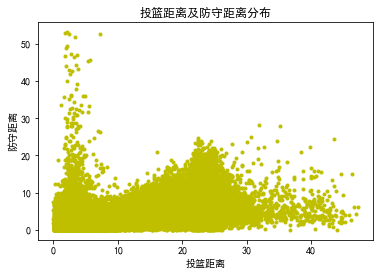

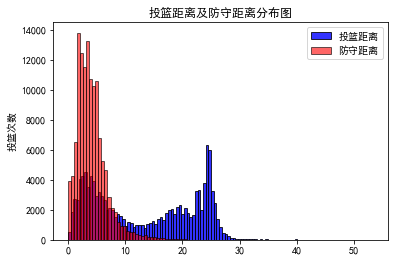

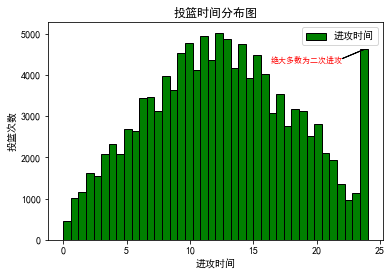

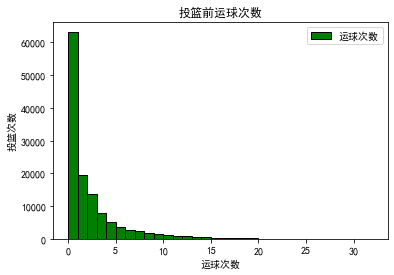

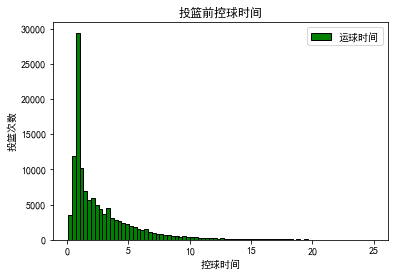

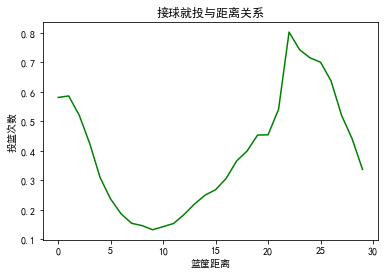

In [ ]:
work_subtask2(shot_table)

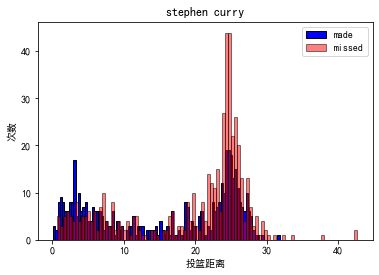

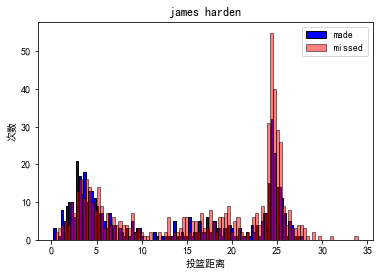

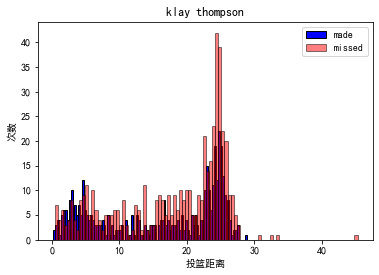

In [ ]:
work_subtask3(shot_table)

In [ ]:
work_subtask4(shot_table)

0.6294356562633604


In [ ]:
# work_subtask5(shot_table)

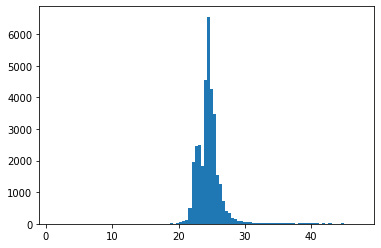

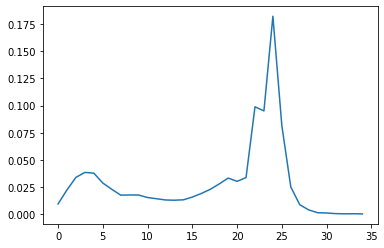

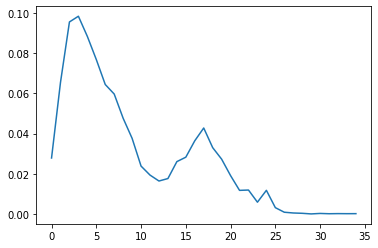

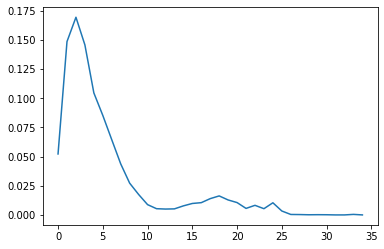

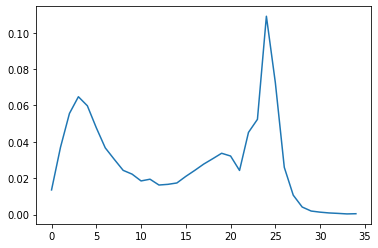

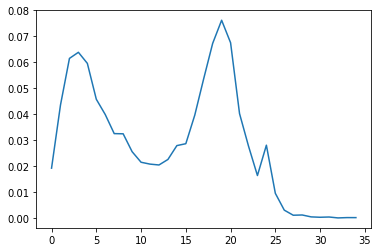

[(970, (202691, 'klay thompson')), (793, (2037, 'jamal crawford')), (770, (201567, 'kevin love')), (754, (202340, 'avery bradley')), (746, (202083, 'wesley matthews')), (687, (201167, 'arron afflalo')), (683, (2772, 'trevor ariza')), (680, (203484, 'kentavious caldwell-pope')), (649, (200755, 'jj redick')), (627, (101123, 'gerald green')), (575, (203463, 'ben mclemore')), (563, (203082, 'terrence ross')), (556, (201980, 'danny green')), (555, (101139, 'cj miles')), (555, (2590, 'mo williams')), (552, (203110, 'draymond green')), (541, (201943, 'brandon jennings')), (540, (202349, 'greivis vasquez')), (532, (202694, 'marcus morris')), (527, (1718, 'paul pierce')), (509, (203496, 'robert covington')), (490, (1938, 'manu ginobili')), (478, (2594, 'kyle korver')), (475, (201584, 'courtney lee')), (472, (202325, 'wesley johnson')), (470, (201156, 'nick young')), (462, (201960, 'demarre carroll')), (459, (202390, 'gary neal')), (456, (201976, 'patrick beverley')), (450, (201587, 'nicolas bat

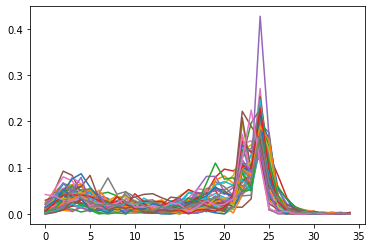

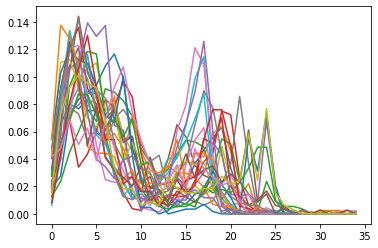

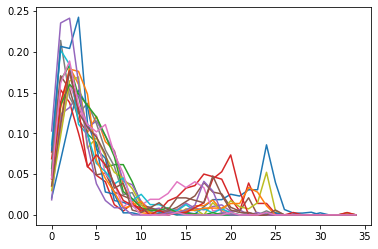

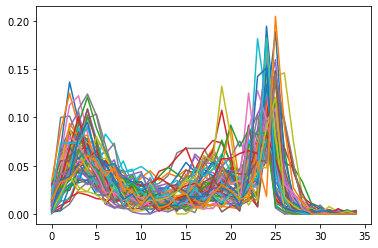

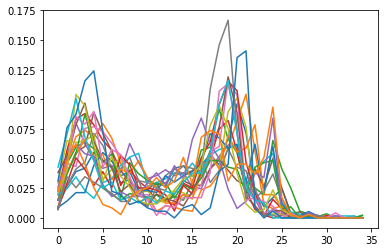

In [ ]:
KC = 5
def kmeans(data,k = 2):#KMeans
    def distance(x,y):#欧几里得距离函数
        return np.sum((x-y)**2)**0.5
    def rand_center(data, k = 2):#随机质心
        n = data.shape[1]
        cen = np.zeros((k,n))
        for i in range(k):
            cen[i]=data[i]
        return cen
    
    n = data.shape[0]
    cen = rand_center(data,k)
    label = np.zeros(n)
    assement = np.zeros(n)
    for t in range(300):
        lcen = np.copy(cen)
        for i in range(n):
            mindist, minindex = np.inf, -1#最近质心点距离及对应标号
            for j in range(k):#枚举各个点集
                dist = distance(data[i],cen[j])#计算距离
                if dist < mindist:#更新
                    mindist, minindex = dist, j
                    label[i] = j
        for i in range(k):#重新计算质心
            cen[i] = np.mean(data[label==i],axis=0)
    Dist = 0.
    for i in range(n):#计算每个点集中点到质心的距离和
        Dist += distance(data[i],cen[int(label[i])])
    for i in range(KC):
        plt.plot(cen[i])
        plt.show()
    return label,Dist
data = shot_table
player = {}
sdist = []
for d in data.values:
    # print(d)
    if d[12]==3:
        sdist.append(d[11])
    id,name,dist,result = d[20],d[19],d[11],d[13]
    if (id,name) not in player:
        player[(id,name)] = {'shot' : [] , 'vector' : [0]*35}
    if dist < 35:
        player[(id,name)]['shot'].append((dist,result))
        player[(id,name)]['vector'][int(dist)] += 1
    #计算每个球员的投球距离向量

plt.hist(sdist,bins=100)
plt.show()
nedata = []
neplayer = []
for number in player:
    player[number]['shot'].sort()
    # print(player[number]['vector'])
    v  = player[number]['vector']/ np.sum(player[number]['vector'])
    #diff = np.diff(v)
    # print(diff)
    if np.sum(player[number]['vector'])>=320:
        neplayer.append(number)
        nedata.append(v)
    # print(v)
    # plt.show()
    # plt.show()
# print(len(s))
label,Dist = kmeans(np.array(nedata),KC)
# print(KC,Dist)
Divide = [[] for i in range(KC)]
for id,number in enumerate(neplayer):
    # print(id,label[id])
    Divide[int(label[id])].append((np.sum(player[number]['vector']),number))            
for i in range(KC):
    Divide[i].sort(reverse=True)
    print(Divide[i])

for i in range(KC):
    c = 0 
    for number in Divide[i]:
        if c>10:
            break
        plt.plot(player[number[1]]['vector']/ np.sum(player[number[1]]['vector']))
    plt.show()
    